In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error

from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")

## Problem 1

In [3]:
p_red = np.array([0.1, 0.15, 0.2, 0.2, 0.55, 0.6, 0.6, 0.65, 0.7, 0.75])
p_green = np.array([0.9, 0.85, 0.8, 0.8, 0.45, 0.4, 0.4, 0.35, 0.3, 0.25])

# Determine whether the red or green probability is greater for each estimate
majority = p_red - p_green
majority

array([-0.8, -0.7, -0.6, -0.6,  0.1,  0.2,  0.2,  0.3,  0.4,  0.5])

There are 6 of 10 cases where P(Class is Red|X) > P(Class is Green|X), so majority vote makes the final classification to be red.

In [4]:
# Find the average probability for each classification
print("Average P(Class is Red|X): ", p_red.mean())
print("Average P(Class is Green|X): ", p_green.mean())

Average P(Class is Red|X):  0.45
Average P(Class is Green|X):  0.55


The average probability is higher for the green classification, so classification based on average probability results in a final classification of green.

## Problem 2

In [8]:
hitters = pd.read_csv("Hitters.csv")
hitters.rename(columns = {"Unnamed: 0": "Name"}, inplace = True)

Part a: Remove observations for whom salary info is unknown, log-transform salaries

In [9]:
hitters = hitters.dropna(subset=["Salary"])
hitters["Salary"] = np.log(hitters["Salary"])

In [10]:
# Change League and Division to 1s and 0s for analysis
hitters["League"] = np.where(hitters["League"] == "N", 1, 0)
hitters["Division"] = np.where(hitters["Division"] == "W", 1, 0)
hitters["NewLeague"] = np.where(hitters["NewLeague"] == "N", 1, 0)

Part b: Create training (200) and test (else) sets

In [11]:
train = hitters.iloc[0:200, :]
test = hitters.iloc[200:, :]

x_train = train.loc[:, train.columns != "Name"]
x_train = x_train.loc[:, x_train.columns != "Salary"]
y_train = train[["Salary"]]

x_test = test.loc[:, test.columns != "Name"]
x_test = x_test.loc[:, x_test.columns != "Salary"]
y_test = test[["Salary"]]

Part c: Boosting on training set

In [12]:
train_MSE = []
test_MSE = []
params = np.linspace(0.01, 1, 100)

for shrinkage in params:
    model = GradientBoostingRegressor(n_estimators = 1000, learning_rate = shrinkage)
    model.fit(x_train, y_train)
    
    train_pred = model.predict(x_train)
    train_MSE.append(mean_squared_error(train_pred, y_train))
    
    test_pred = model.predict(x_test)
    test_MSE.append(mean_squared_error(test_pred, y_test))

Part c: plot training error v shrinkage parameter

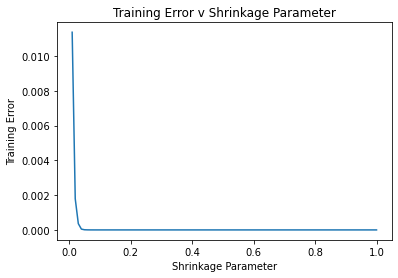

In [13]:
plt.plot(params, train_MSE)
plt.title("Training Error v Shrinkage Parameter")
plt.xlabel("Shrinkage Parameter")
plt.ylabel("Training Error")
plt.show()

Part d: plot test error v shrinkage parameter

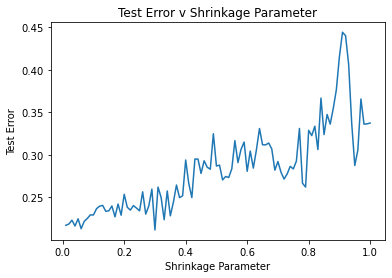

In [14]:
plt.plot(params, test_MSE)
plt.title("Test Error v Shrinkage Parameter")
plt.xlabel("Shrinkage Parameter")
plt.ylabel("Test Error")
plt.show()

Part e: comparison with regression test MSEs from multiple linear regression and Ridge regression

Using multiple linear regression or ridge regression, the test MSE is near the peak of the test MSE produced by boosting, using different shrinkage parameters. This means that selecting the correct shrinkage parameter should give much better performance than MLM or Ridge.

In [15]:
from sklearn.linear_model import LinearRegression

# Apply multiple linear regression model
mlm = LinearRegression()

# Fit model
mlm.fit(x_train, y_train)

# Make predictions on validation set
y_pred_mlm = mlm.predict(x_test)

# Compute RMSE
mean_squared_error(y_test, y_pred_mlm)

0.491795937545494

In [16]:
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Ridge, RidgeCV

# Create array of alphas to test (recommended range from 0 to 1 at 0.01 intervals)
alphas = np.arange(0, 1, 0.01)

# Set folds
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

# Fit model to find best alpha
ridgeR = RidgeCV(alphas = alphas, cv = cv)
ridgeR.fit(x_train, y_train)

# Find best alpha
alpha = ridgeR.alpha_

# Fit new model with best alpha
best_ridge = Ridge(alpha = alpha)
best_ridge.fit(x_train, y_train)

# Make predictions on validation set
y_pred_ridge = best_ridge.predict(x_test)

# Compute RMSE
mean_squared_error(y_test, y_pred_ridge)

0.49276745739362715

Part f: by far the most important predictor seems to be CAtBat

The minimum test MSE in the boosted models occurs when the learning rate is 0.06

In [17]:
model = GradientBoostingRegressor(n_estimators = 1000, learning_rate = 0.06)
model.fit(x_train, y_train)
    
train_pred = model.predict(x_train)
mean_squared_error(train_pred, y_train)
  
test_pred = model.predict(x_test)
mean_squared_error(test_pred, y_test)

0.21723347927072031

In [18]:
for index, feature in enumerate(list(model.feature_importances_)):
    if feature == max(model.feature_importances_):
        col_index = index
        
x_train.columns[col_index]

'CAtBat'

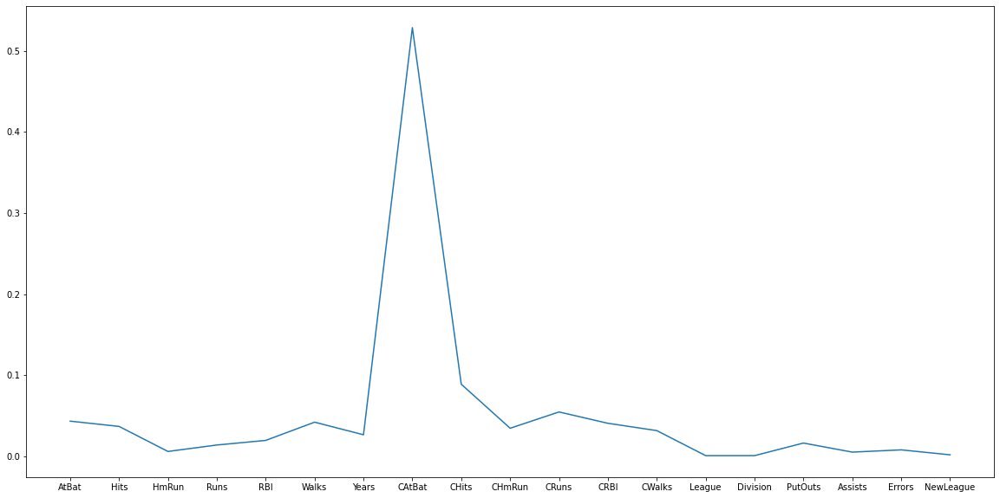

In [19]:
plt.figure(figsize = (20,10))
plt.plot(x_train.columns.tolist(), model.feature_importances_)

Part g: the test MSE is about 0.25

In [20]:
from sklearn.ensemble import BaggingRegressor

bag_model = BaggingRegressor()
bag_model.fit(x_train, y_train)
bag_pred = bag_model.predict(x_test)
mean_squared_error(bag_pred, y_test)

0.24945616062760315

## Problem 3

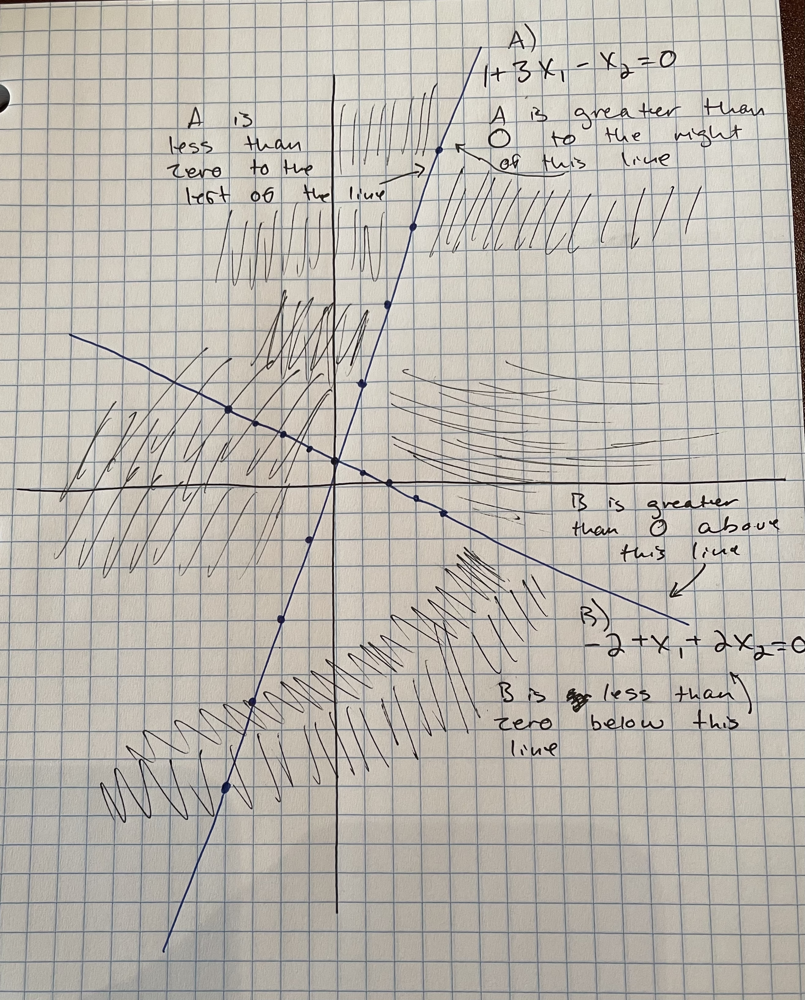

In [23]:
Image("Homework7Problem3.png")

## Problem 4

In [24]:
auto = pd.read_csv("Auto.csv")

Part a: also need to manipulate the horsepower variable to get rid of "?" entries

In [26]:
auto["bin_mpg"] = np.where(auto["mpg"] > auto["mpg"].median(), 1, 0)
auto = auto[auto["horsepower"] != "?"]
auto["horsepower"] = auto["horsepower"].astype(int)

In [37]:
X = auto.iloc[:, 1:8]
y = auto.iloc[:, 9]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4)

Part b: the highest mean test score is where C=.001

In [38]:
params = {"C":[1e-4, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4]}
          
clf_lin = GridSearchCV(estimator = SVC(kernel="linear", random_state=1), param_grid = params, n_jobs=5, cv=5)
clf_lin.fit(X, y)
print("Best estimator: ", clf_lin.best_estimator_, "\nBest score:", clf_lin.best_score_,"\n")
for i in range(9):
    print("C: ", params["C"][i], ", Mean Test Score: ", clf_lin.cv_results_["mean_test_score"][i])

Best estimator:  SVC(C=0.001, kernel='linear', random_state=1) 
Best score: 0.9029211295034081 

C:  0.0001 , Mean Test Score:  0.897792924375203
C:  0.001 , Mean Test Score:  0.9029211295034081
C:  0.01 , Mean Test Score:  0.8776046738072054
C:  0.1 , Mean Test Score:  0.8700421940928269
C:  1 , Mean Test Score:  0.8751054852320674
C:  10.0 , Mean Test Score:  0.8624797143784486
C:  100.0 , Mean Test Score:  0.8573515092502435
C:  1000.0 , Mean Test Score:  0.8624797143784486
C:  10000.0 , Mean Test Score:  0.8574164232392081


In [39]:
svc_model_lin = SVC(kernel = "linear", C = 0.001)
svc_model_lin.fit(X_train, y_train)
pred_linear = svc_model_lin.predict(X_test)
mean_squared_error(pred_linear, y_test)

0.12738853503184713

Part c: using rbf as the kernel with best parameters gives a smaller mean_squared_error than linear with best parameters.

Poly doesn't terminate if the degree is greater than 1, so poly is essentially linear here. Using poly as the kernel with best parameters means using a larger cost and gamma, but somehow still gives the same mean_squared_error as rbf. Not sure what is going on here.

In [40]:
params = {"C":[1e-4, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4], 
          "gamma":[0.001, 0.01, 0.1, 1, 10, 100, 1000]}

clf_rbf = GridSearchCV(estimator = SVC(kernel="rbf", random_state=1), param_grid = params, n_jobs=5, cv=5)
clf_rbf.fit(X_train, y_train)
print("Best estimator: ", clf_rbf.best_estimator_, "\nBest score:", clf_rbf.best_score_,"\n")
for i in range(9):
    print("C: ", params["C"][i], ", Mean Test Score: ", clf_rbf.cv_results_["mean_test_score"][i])

Best estimator:  SVC(C=1, gamma=0.001, random_state=1) 
Best score: 0.8808510638297872 

C:  0.0001 , Mean Test Score:  0.5063829787234042
C:  0.001 , Mean Test Score:  0.5063829787234042
C:  0.01 , Mean Test Score:  0.5063829787234042
C:  0.1 , Mean Test Score:  0.5063829787234042
C:  1 , Mean Test Score:  0.5063829787234042
C:  10.0 , Mean Test Score:  0.5063829787234042
C:  100.0 , Mean Test Score:  0.5063829787234042
C:  1000.0 , Mean Test Score:  0.5063829787234042
C:  10000.0 , Mean Test Score:  0.5063829787234042


In [41]:
svc_model_rbf = SVC(kernel = "rbf", C = 1, gamma=0.001, random_state=1)
svc_model_rbf.fit(X_train, y_train)
pred_rbf = svc_model_rbf.predict(X_test)
mean_squared_error(pred_rbf, y_test)

0.11464968152866242

In [42]:
params = {"C":[1e-4, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4], 
          "gamma":[0.01, 0.1, 1, 10, 100]}

clf_poly = GridSearchCV(SVC(random_state=1, kernel="poly", degree = 1), param_grid = params, n_jobs=5, cv=5)
clf_poly.fit(X_train, y_train)
print("Best estimator: ", clf_poly.best_estimator_, "\nBest score:", clf_poly.best_score_,"\n")
for i in range(9):
    print("C: ", params["C"][i], ", Mean Test Score: ", clf_poly.cv_results_["mean_test_score"][i])

Best estimator:  SVC(C=10.0, degree=1, gamma=0.01, kernel='poly', random_state=1) 
Best score: 0.9319148936170214 

C:  0.0001 , Mean Test Score:  0.8936170212765957
C:  0.001 , Mean Test Score:  0.9063829787234043
C:  0.01 , Mean Test Score:  0.9276595744680851
C:  0.1 , Mean Test Score:  0.9234042553191489
C:  1 , Mean Test Score:  0.9276595744680851
C:  10.0 , Mean Test Score:  0.9063829787234043
C:  100.0 , Mean Test Score:  0.9276595744680851
C:  1000.0 , Mean Test Score:  0.9276595744680851
C:  10000.0 , Mean Test Score:  0.9276595744680851


In [43]:
svc_model_poly = SVC(kernel = "poly", C = 10, degree=1, gamma=.01, random_state=1)
svc_model_poly.fit(X_train, y_train)
pred_poly = svc_model_poly.predict(X_test)
mean_squared_error(pred_poly, y_test)

0.11464968152866242